# Import libraries

In [ ]:
# Import necessary libraries
import numpy as np # Import the NumPy library for numerical operations
# Import Keras components for building and training neural networks
from keras.models import Model # Import the Model class to create a neural network model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Conv2DTranspose, multiply, Lambda, add, Activation # Import various layers used in the model
from keras.layers import concatenate# Import the concatenate layer for merging tensors
from keras.optimizers import * # Import optimizers for configuring the model's learning process
import keras.backend as K # Import Keras backend functions
from keras.callbacks import EarlyStopping # Import the EarlyStopping callback
from keras.preprocessing import image  # Import image preprocessing utilities
import tensorflow as tf # Import TensorFlow library
import matplotlib.pyplot as plt  # Import the matplotlib library for plotting
%matplotlib inline
 # Enable inline plotting for colabs
# Import scikit-learn utilities for metrics and cross-validation
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix # Import metrics for evaluation
from sklearn.model_selection import KFold  # Import KFold for cross-validation
# Import OS and listdir for directory manipulation
import os  # Import the OS library for operating system-related functions
from os import listdir # Import the listdir function for listing directory contents
import natsort   # Import the natsort library for natural sorting
import datetime # Import the datetime library for time-related functions
now = datetime.datetime.now # Create a reference to the current time function

# Load the images

In [ ]:
#Setting up path for google drive
from google.colab import drive
drive.mount('/content/drive')
# Directory with images and ground truths
path_imgs = "/content/drive/MyDrive/a"#path to the image folder
path_masks = "/content/drive/MyDrive/b"#path to the mask folder

Mounted at /content/drive


#Setting and Introducing the parameters

In [ ]:
#Setting up the important parameters
# It lists the files in the directory specified by path_imgs. These are presumably the filenames of the images in the dataset.
imagesList = listdir(path_imgs)

# Sort the images in ascending order
imgList=natsort.natsorted(imagesList)

# Introduce parameters
img_row = 256 # height (number of pixels) of the images
img_col = 256 # width (number of pixels ) of images
img_chan = 1 # The number of channels in the images (1 for grayscale, 3 for RGB)
epochnum = 200 # The number of training epochs (iterations)
batchnum = 4 # The batch size used during training (number of images in each batch)
input_size = (img_row, img_col, img_chan) # The input size expected by the neural network

num_imgs = len(imgList)# Calculate the total number of images in the dataset
print("Number of images:", num_imgs)# Print the number of images for informational purposes

Number of images: 100


In [ ]:
import os  # Import the OS library for operating system-related functions
import numpy as np   # Import the NumPy library for numerical operations
import tensorflow as tf # Import the TensorFlow library for deep learning

# Define a function for loading images and preprocessing
def img_load(dir_path, imgs_list, imgs_array):
    for i in range(len(imgs_list)): # Iterate over the list of image filenames
    # Load the image from the specified path, resize it, and convert to grayscale
        tmp_img = tf.keras.preprocessing.image.load_img(
            os.path.join(dir_path, imgs_list[i]),# Load the image by joining the directory path and filename
            target_size=(img_row, img_col), # Resize the image to the specified dimensions
            color_mode='grayscale'  # Specify that the image should be treated as grayscale
        )
        img = tf.keras.preprocessing.image.img_to_array(tmp_img) # Convert the image to a NumPy array
        # Normaliza pixel values to the range [0,1 ]
        imgs_array[i] = img[:, :, 0] / 255.0

    # Expand the dimensions of the arrays to add a channel dimension
    imgs_array = np.expand_dims(imgs_array, axis=3)
    return imgs_array # Returned the preprocessed array of images


# Initialize empty  arrays for images and masks
imgs = np.zeros((num_imgs, img_row, img_col)) # Create an array for images with specified dimensions
masks = np.zeros_like(imgs) # Create an array for masks with the same shape as images

#Load and preprocess images using the img_load function
imgs = img_load(path_imgs, imgList, imgs) # Load and preproces images from the specified path
masks = img_load(path_masks, imgList, masks) # load and preprocess masks from the specified path

# Print the shapes of the loaded and preprocessed images and masks
print("Images", imgs.shape)# Print the shape of the images array
print("Masks", masks.shape)  # Print the shape of the masks array


Images (100, 256, 256, 1)
Masks (100, 256, 256, 1)


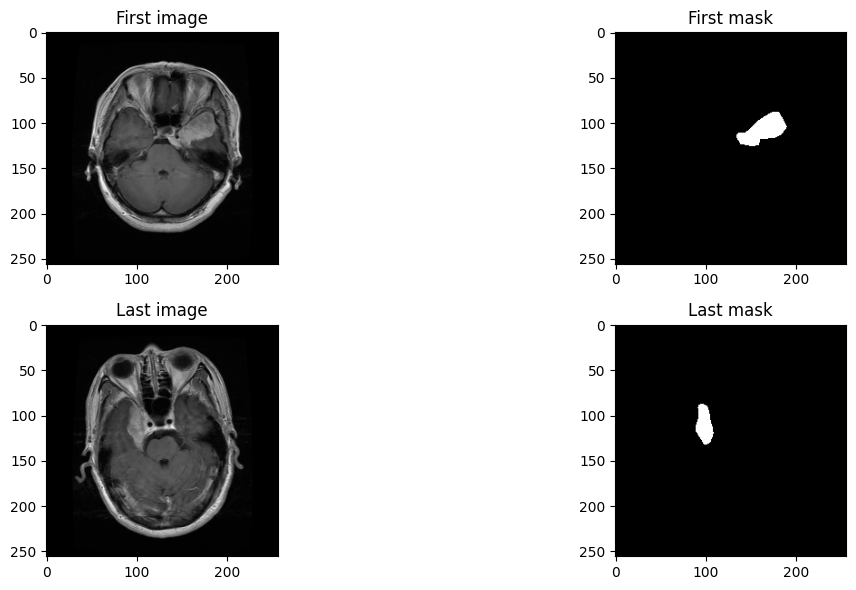

In [ ]:
# Import necessary libraries for plotting
plt.figure(figsize = (14,6)) # Create a new figure with a specified size
plt.subplot(221) # Create subplots in a 2x2 grid and specify the position of the first subplot
plt.imshow(np.squeeze(imgs[0]), cmap = "gray") # Display the first mask in the masks array, remove singleton dimensions (squeeze), and use a grayscale color map
plt.title('First image') # Set the title for the second subplot
plt.subplot(222)  # Create subplots in a 2x2 grid and specify the position of the third subplot
plt.imshow(np.squeeze(masks[0]), cmap = "gray")
plt.title('First mask')
plt.subplot(223)
plt.imshow(np.squeeze(imgs[-1]), cmap = "gray")
plt.title('Last image')
plt.subplot(224)
plt.imshow(np.squeeze(masks[-1]), cmap = "gray")
plt.title('Last mask')
plt.tight_layout()
plt.show()

# Performance metrics

In [ ]:
# Define loss and performance metrics
# Partially from Abraham and Khan (2019) - A Novel Focal Tversly Loss Function for Lesion Segmentation

# Dice score coefficient and Dice loss
def dsc(y_true, y_pred):
    smooth = 1.
    # masks
    y_true_fm = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_fm * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_fm) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dsc(y_true, y_pred)
    return loss

# Performance metrics: Dice score coefficient, IOU, recall, sensitivity
def auc(y_true, y_pred):
    y_pred_pos = np.round(np.clip(y_pred, 0, 1))
    y_pred_neg = 1 - y_pred_pos
    y_pos = np.round(np.clip(y_true, 0, 1)) # ground truth
    y_neg = 1 - y_pos
    tp = np.sum(y_pos * y_pred_pos)
    tn = np.sum(y_neg * y_pred_neg)
    fp = np.sum(y_neg * y_pred_pos)
    fn = np.sum(y_pos * y_pred_neg)
    tpr = (tp + K.epsilon()) / (tp + fn + K.epsilon()) #recall
    tnr = (tn + K.epsilon()) / (tn + fp + K.epsilon())
    prec = (tp + K.epsilon()) / (tp + fp + K.epsilon()) #precision
    iou = (tp + K.epsilon()) / (tp + fn + fp + K.epsilon()) #intersection over union
    dsc = (2*tp + K.epsilon()) / (2*tp + fn + fp + K.epsilon()) #dice score
    return [dsc, iou, tpr, prec]

In [ ]:
# Convolutional block for UNet
def ConvBlock(in_fmaps, num_fmaps):
    # Inputs: feature maps for UNet, number of output feature maps
    conv1 = Conv2D(num_fmaps, (3, 3), activation='relu', padding='same')(in_fmaps)
    conv_out = Conv2D(num_fmaps, (3, 3), activation='relu', padding='same')(conv1)
    return conv_out

# Network

In [ ]:
# Build the model
def Network():

    input = Input(shape=input_size)

    conv1 = ConvBlock(input, 32)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = ConvBlock(pool1, 32)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = ConvBlock(pool2, 64)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = ConvBlock(pool3, 64)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = ConvBlock(pool4, 128)

    up6 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
    conv6 = ConvBlock(up6, 64)

    up7 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
    conv7 = ConvBlock(up7, 64)

    up8 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
    conv8 = ConvBlock(up8, 32)

    up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
    conv9 = ConvBlock(up9, 32)

    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    model = Model(inputs = input, outputs = conv10)

    return model

# Training and cross-validation

Run # 1


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Training time: 0:02:03.300180


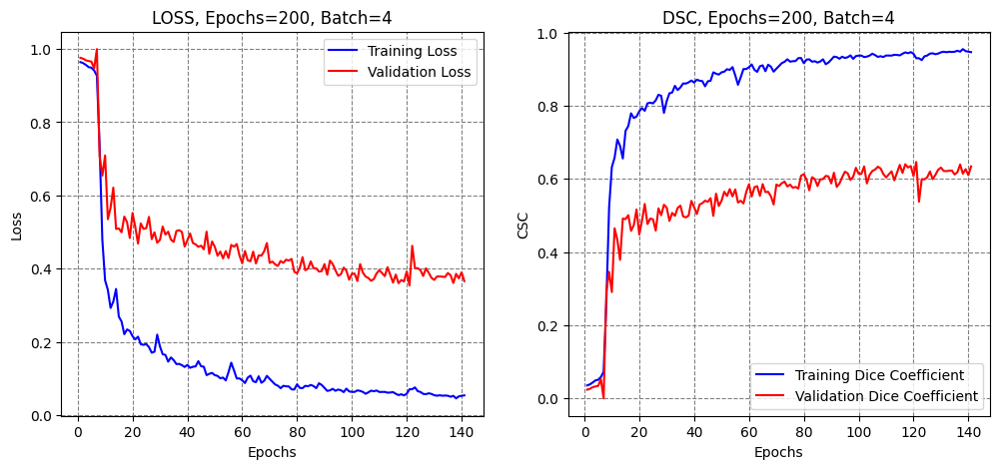

1/1 [==============================] - 3s 3s/step
Testing time: 0:00:02.762065
------------------------------
USING THRESHOLD 0.5

 DSC 		0.777 
 IOU 		0.685 
 Recall 	0.774 
 Precision	0.869


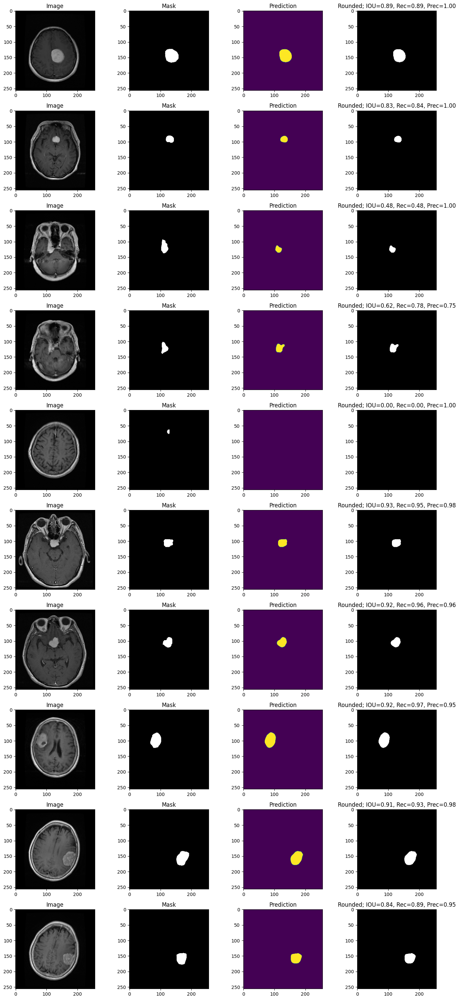

 Global Acc 	0.995
 AUC ROC 	0.996


************************************************************
Run # 2


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Training time: 0:00:22.398570


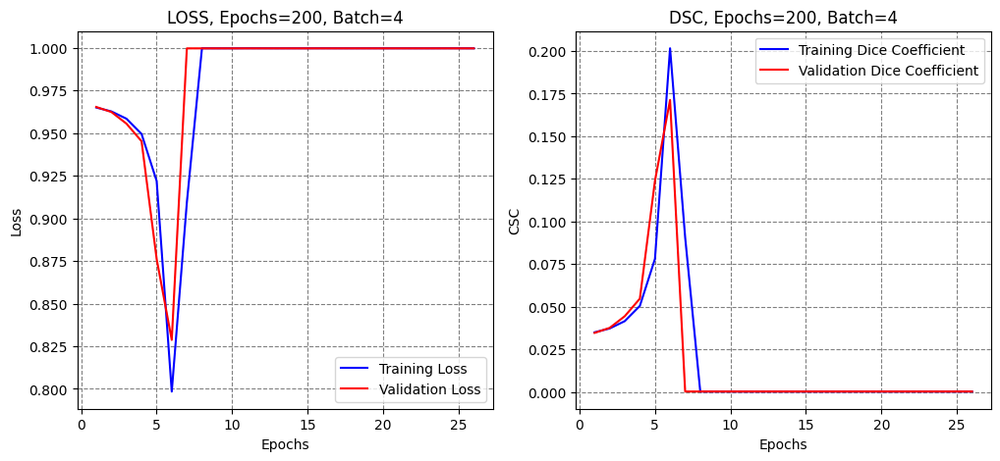

1/1 [==============================] - 0s 252ms/step
Testing time: 0:00:00.373408
------------------------------
USING THRESHOLD 0.5

 DSC 		0.000 
 IOU 		0.000 
 Recall 	0.000 
 Precision	1.000


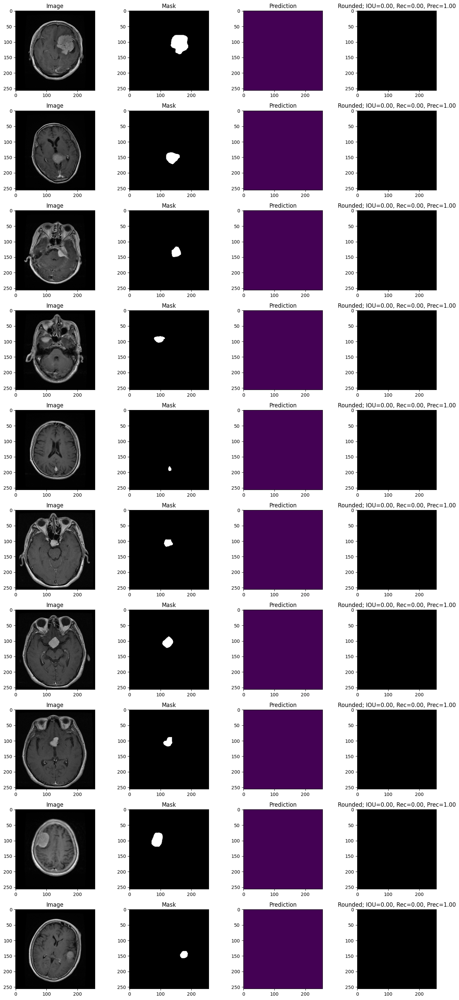

 Global Acc 	0.986
 AUC ROC 	0.439


************************************************************
Run # 3


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Training time: 0:01:29.745664


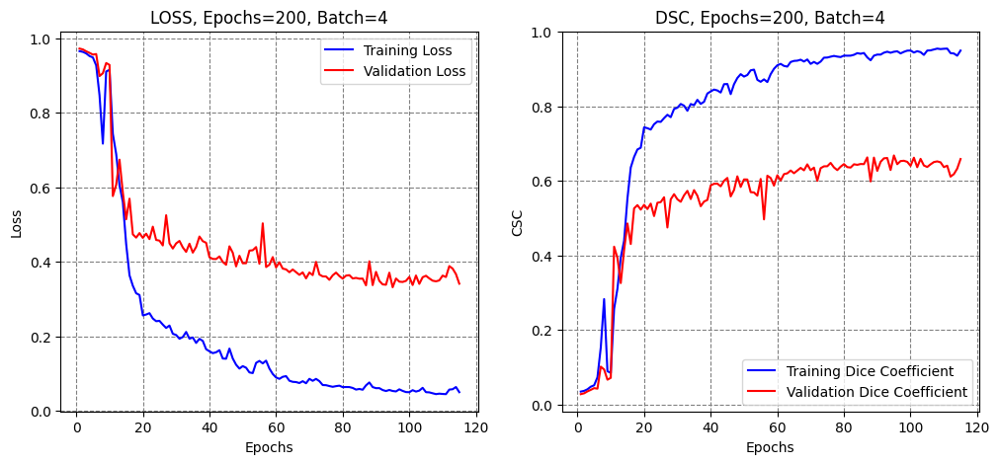

1/1 [==============================] - 0s 254ms/step
Testing time: 0:00:00.377894
------------------------------
USING THRESHOLD 0.5

 DSC 		0.697 
 IOU 		0.606 
 Recall 	0.704 
 Precision	0.807


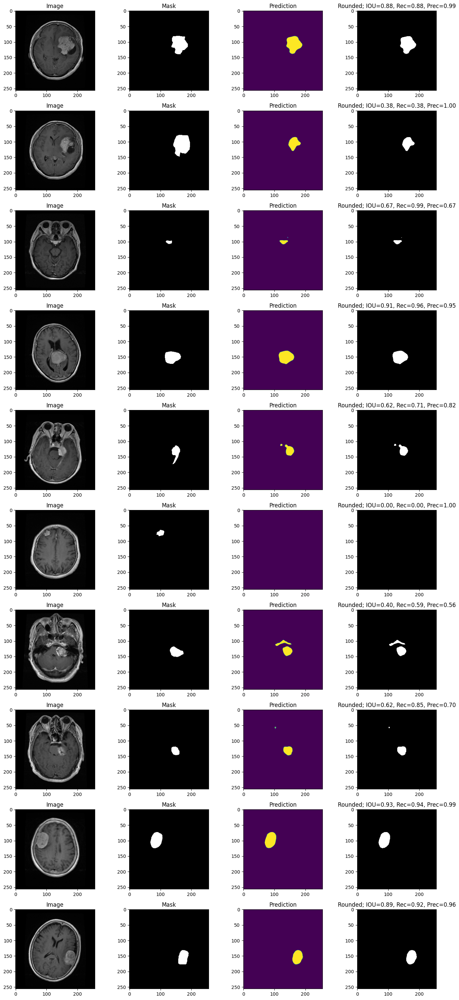

 Global Acc 	0.992
 AUC ROC 	0.987


************************************************************
Run # 4


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Training time: 0:00:51.486392


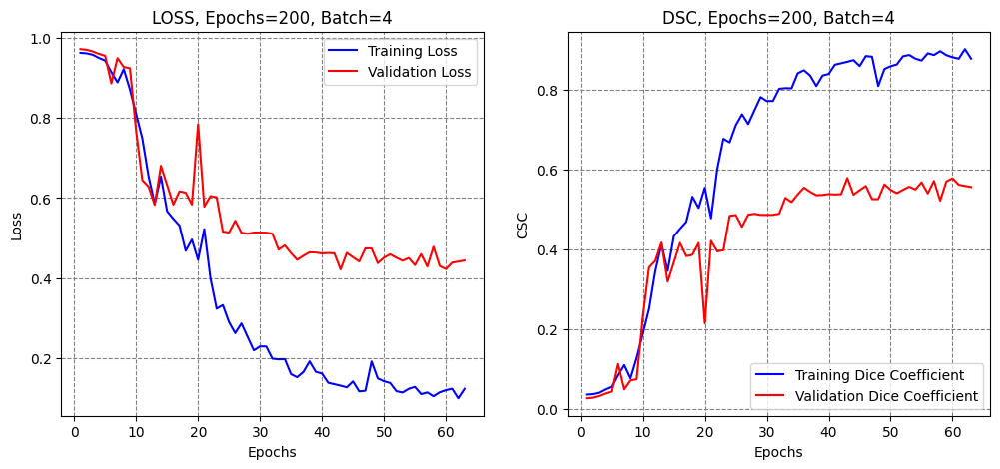

1/1 [==============================] - 0s 279ms/step
Testing time: 0:00:00.389899
------------------------------
USING THRESHOLD 0.5

 DSC 		0.576 
 IOU 		0.509 
 Recall 	0.558 
 Precision	0.889


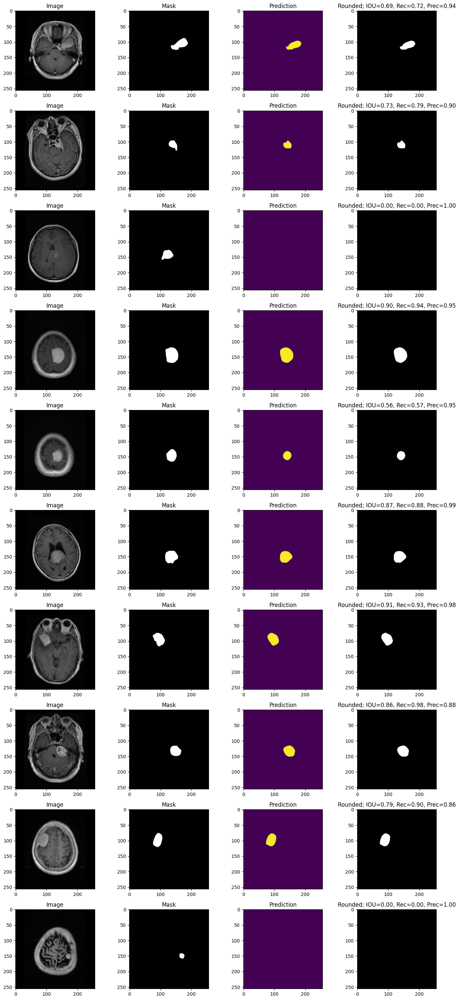

 Global Acc 	0.994
 AUC ROC 	0.973


************************************************************
Run # 5


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Training time: 0:01:49.021359


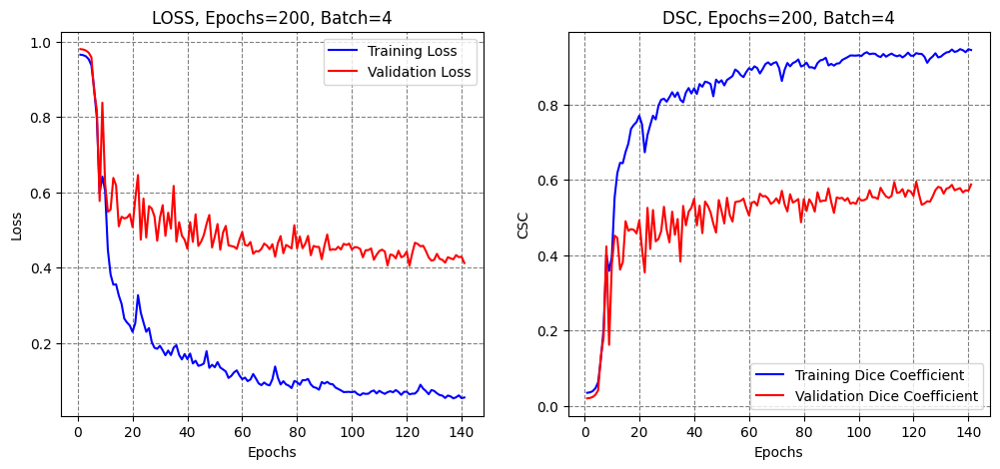

1/1 [==============================] - 0s 250ms/step
Testing time: 0:00:00.358327
------------------------------
USING THRESHOLD 0.5

 DSC 		0.857 
 IOU 		0.788 
 Recall 	0.831 
 Precision	0.940


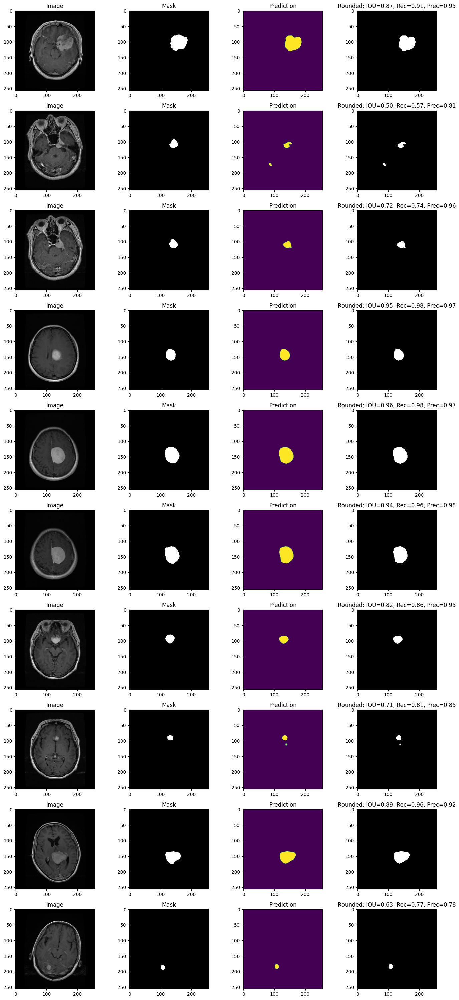

 Global Acc 	0.997
 AUC ROC 	0.995


************************************************************


In [ ]:
# Evaluate the models using using k-fold cross-validation
n_folds = 5

numepochs = np.zeros(n_folds,)
dice_score = np.zeros(n_folds,)
iou_score = np.zeros_like(dice_score)
rec_score = np.zeros_like(dice_score)
prec_score = np.zeros_like(dice_score)
globacc_score = np.zeros_like(dice_score)
auc_roc_score = np.zeros_like(dice_score)

# Prepare cross-validation
kfold = KFold(n_folds, shuffle=True, random_state=1)

run = 0;
# enumerate splits
for train_ix, test_ix in kfold.split(imgs):

    # Display the run number
    print('Run #', run+1)

    # Define  the model
    model = Network()

    # Split into train and test sets
    imgs_train, masks_train, imgs_test, masks_test = imgs[train_ix], masks[train_ix], imgs[test_ix], masks[test_ix]

    # Compile and fit the  model
    model.compile(optimizer = Adam(lr = 0.0001), loss = dice_loss, metrics = [dsc])

    t = now()
    callbacks = [EarlyStopping(monitor='val_loss', patience = 20)]
    history = model.fit(imgs_train, masks_train, validation_split=0.15, batch_size=batchnum,
                        epochs=epochnum, verbose=0, callbacks=callbacks)

    print('Training time: %s' % (now() - t))

    # Plot the loss and accuracy
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    acc = history.history['dsc']
    val_acc = history.history['val_dsc']

    epochsn = np.arange(1, len(train_loss)+1,1)
    plt.figure(figsize = (12,5))
    plt.subplot(121)
    plt.plot(epochsn,train_loss, 'b', label='Training Loss')
    plt.plot(epochsn,val_loss, 'r', label='Validation Loss')
    plt.grid(color='gray', linestyle='--')
    plt.legend()
    plt.title('LOSS, Epochs={}, Batch={}'.format(epochnum, batchnum))
    plt.xlabel('Epochs')
    plt.ylabel('Loss')

    plt.subplot(122)
    plt.plot(epochsn, acc, 'b', label='Training Dice Coefficient')
    plt.plot(epochsn, val_acc, 'r', label='Validation Dice Coefficient')
    plt.grid(color='gray', linestyle='--')
    plt.legend()
    plt.title('DSC, Epochs={}, Batch={}'.format(epochnum, batchnum))
    plt.xlabel('Epochs')
    plt.ylabel('CSC')
    plt.show()

    # Make predictions
    t = now()
    preds = model.predict(imgs_test)
    print('Testing time: %s' % (now() - t))

    # Evaluate model
    num_test = len(imgs_test)
    # Calculate performance metrics
    dsc_sc = np.zeros((num_test,1))
    iou_sc = np.zeros_like(dsc_sc)
    rec_sc = np.zeros_like(dsc_sc)
    tn_sc = np.zeros_like(dsc_sc)
    prec_sc = np.zeros_like(dsc_sc)
    thresh = 0.5
    for i in range(num_test):
        dsc_sc[i], iou_sc[i], rec_sc[i], prec_sc[i] = auc(masks_test[i], preds[i] >thresh)
    print('-'*30)
    print('USING THRESHOLD', thresh)
    print('\n DSC \t\t{0:^.3f} \n IOU \t\t{1:^.3f} \n Recall \t{2:^.3f} \n Precision\t{3:^.3f}'.format(
            np.sum(dsc_sc)/num_test,
            np.sum(iou_sc)/num_test,
            np.sum(rec_sc)/num_test,
            np.sum(prec_sc)/num_test ))


    # To plot a set of images with predicted masks uncomment these lines
    num_disp = 10
    j=1
    plt.figure(figsize = (14,num_disp*3))
    for i in range(num_disp):
        plt.subplot(num_disp,4,j)
        plt.imshow(np.squeeze(imgs_test[i]), cmap='gray')
        plt.title('Image')
        j +=1
        plt.subplot(num_disp,4,j)
        plt.imshow(np.squeeze(masks_test[i]),cmap='gray')
        plt.title('Mask')
        j +=1
        plt.subplot(num_disp,4,j)
        plt.imshow(np.squeeze(preds[i]))
        plt.title('Prediction')
        j +=1
        plt.subplot(num_disp,4,j)
        plt.imshow(np.squeeze(np.round(preds[i])), cmap='gray')
        plt.title('Rounded; IOU=%0.2f, Rec=%0.2f, Prec=%0.2f' %(iou_sc[i], rec_sc[i], prec_sc[i]))
        j +=1
    plt.tight_layout()
    plt.show()


    # Confusion matrix
    confusion = confusion_matrix( masks_test.ravel(),preds.ravel()>thresh)
    accuracy = 0
    if float(np.sum(confusion))!=0:
        accuracy = float(confusion[0,0]+confusion[1,1])/float(np.sum(confusion))
    print(' Global Acc \t{0:^.3f}'.format(accuracy))

    # Area under the ROC curve
    AUC_ROC = roc_auc_score(masks_test.ravel(), preds.ravel())
    print(' AUC ROC \t{0:^.3f}'.format(AUC_ROC))
    print('\n')
    print('*'*60)

    # Save outputs
    numepochs[run] = epochsn[-1]
    dice_score[run] = np.sum(dsc_sc) / num_test
    iou_score[run] = np.sum(iou_sc) / num_test
    rec_score[run] = np.sum(rec_sc) / num_test
    prec_score[run] = np.sum(prec_sc) / num_test
    globacc_score[run] = accuracy
    auc_roc_score[run] = AUC_ROC
    run += 1



# Display the Results

In [ ]:
# Display the scores in a table
import pandas
from pandas import DataFrame
df = DataFrame({'Epochs Number': numepochs, 'Dice Score': dice_score, 'IOU Score': iou_score, 'Recall (Sensitivity)': rec_score, 'Precision': prec_score, 'Global Accuracy': globacc_score, 'AUC-ROC': auc_roc_score})
df

,Epochs Number,Dice Score,IOU Score,Recall (Sensitivity),Precision,Global Accuracy,AUC-ROC
0,141.0,7.774552e-01,6.849384e-01,7.738695e-01,0.869477,0.995336,0.995979
1,26.0,1.857846e-10,1.857846e-10,1.857846e-10,1.000000,0.985762,0.439197
2,115.0,6.966248e-01,6.058293e-01,7.040894e-01,0.807399,0.991910,0.987087
3,63.0,5.761401e-01,5.090308e-01,5.578748e-01,0.889364,0.994380,0.972851
4,141.0,8.570930e-01,7.883264e-01,8.307881e-01,0.939531,0.996987,0.995025


In [ ]:
# Calculate mean values of the scores
numepochs_mean = np.mean(numepochs)
dice_mean = np.mean(dice_score)
iou_mean = np.mean(iou_score)
rec_mean = np.mean(rec_score)
prec_mean = np.mean(prec_score)
globacc_mean = np.mean(globacc_score)
auc_roc_mean = np.mean(auc_roc_score)

# Mean values of the scores
df2 = DataFrame({'Epochs Number Mean': numepochs_mean, 'Dice Score Mean': dice_mean, 'IOU Score Mean': iou_mean, 'Recall (Sensitivity) Mean': rec_mean, 'Precision Mean': prec_mean, 'Global Accuracy Mean': globacc_mean, 'AUC-ROC Mean': auc_roc_mean},index=[5])
df2

,Epochs Number Mean,Dice Score Mean,IOU Score Mean,Recall (Sensitivity) Mean,Precision Mean,Global Accuracy Mean,AUC-ROC Mean
5,97.2,0.581463,0.517625,0.573324,0.901154,0.992875,0.878028


In [ ]:
# Calculate standard deviations of the scores
dice_std = np.std(dice_score)
iou_std = np.std(iou_score)
rec_std = np.std(rec_score)
prec_std = np.std(prec_score)
globacc_std = np.std(globacc_score)
auc_roc_std = np.std(auc_roc_score)


# Standard deviations of the scores
df3 = DataFrame({'Dice Score STD': dice_std, 'IOU Score STD': iou_std, 'Recall (Sensitivity) STD': rec_std, 'Precision STD': prec_std, 'Global Accuracy STD': globacc_std, 'AUC-ROC STD': auc_roc_std}, index=[5])
df3

,Dice Score STD,IOU Score STD,Recall (Sensitivity) STD,Precision STD,Global Accuracy STD,AUC-ROC STD
5,0.305213,0.274613,0.300847,0.065078,0.003918,0.219572


#RMask CNN

Run # 1


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Training time: 0:00:25.509734


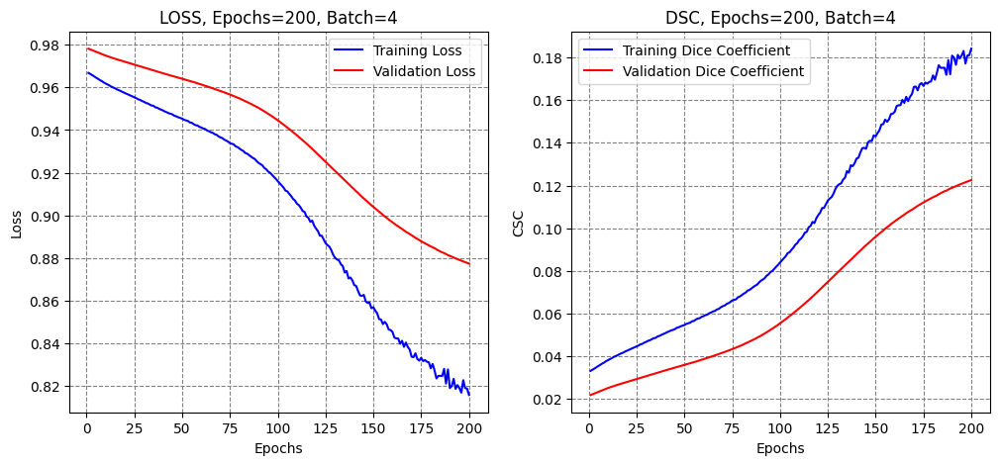

1/1 [==============================] - 0s 200ms/step
Testing time: 0:00:00.252509
------------------------------
USING THRESHOLD 0.5

 DSC 		0.232 
 IOU 		0.138 
 Recall 	0.684 
 Precision	0.157


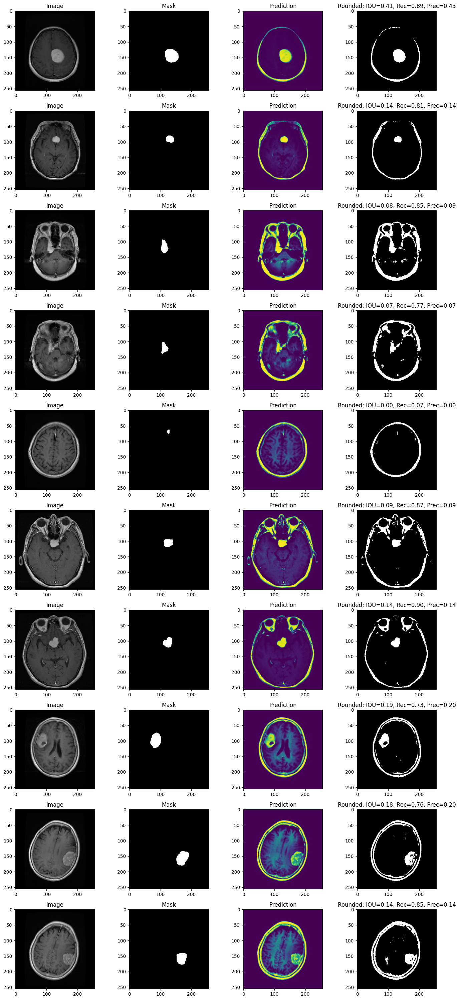

 Global Acc 	0.925
 AUC ROC 	0.921


************************************************************
Run # 2


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Training time: 0:00:41.621472


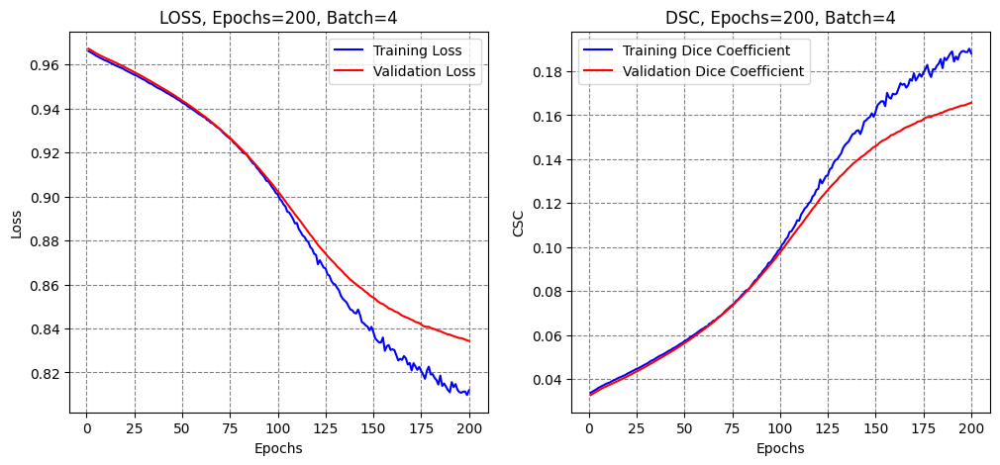

1/1 [==============================] - 0s 50ms/step
Testing time: 0:00:00.120478
------------------------------
USING THRESHOLD 0.5

 DSC 		0.203 
 IOU 		0.116 
 Recall 	0.713 
 Precision	0.130


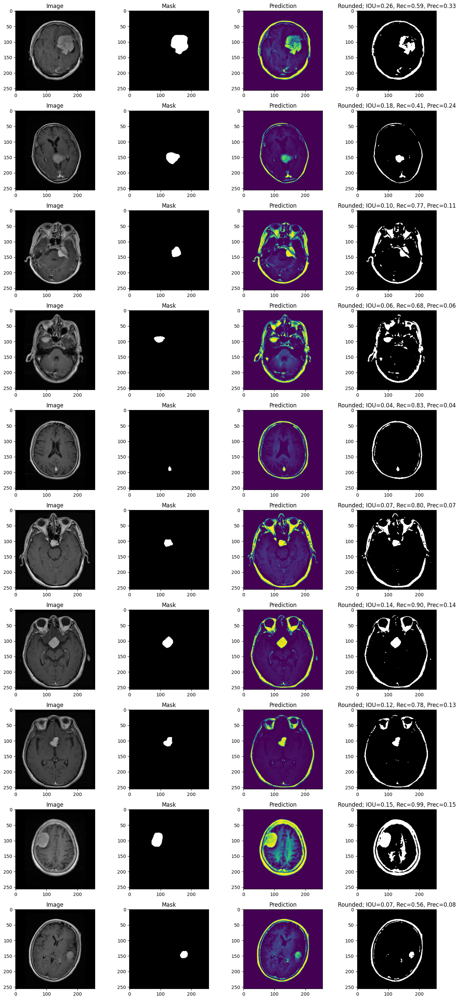

 Global Acc 	0.925
 AUC ROC 	0.930


************************************************************
Run # 3


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Training time: 0:00:41.507608


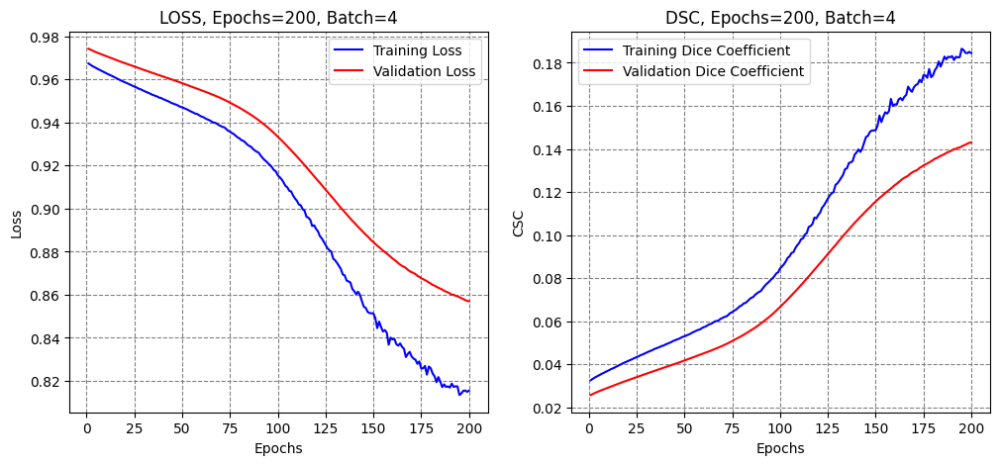

1/1 [==============================] - 0s 78ms/step
Testing time: 0:00:00.178157
------------------------------
USING THRESHOLD 0.5

 DSC 		0.207 
 IOU 		0.121 
 Recall 	0.678 
 Precision	0.142


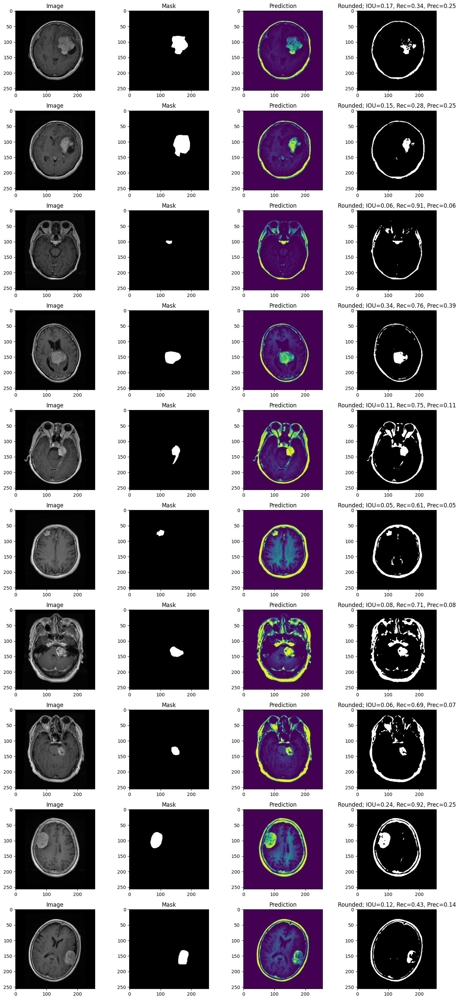

 Global Acc 	0.917
 AUC ROC 	0.904


************************************************************
Run # 4


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Training time: 0:00:27.775658


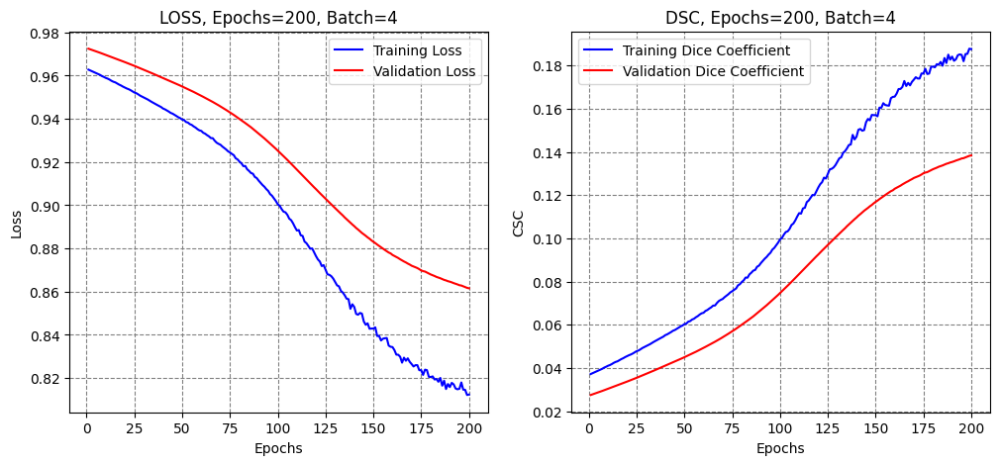

1/1 [==============================] - 0s 66ms/step
Testing time: 0:00:00.127568
------------------------------
USING THRESHOLD 0.5

 DSC 		0.209 
 IOU 		0.123 
 Recall 	0.718 
 Precision	0.130


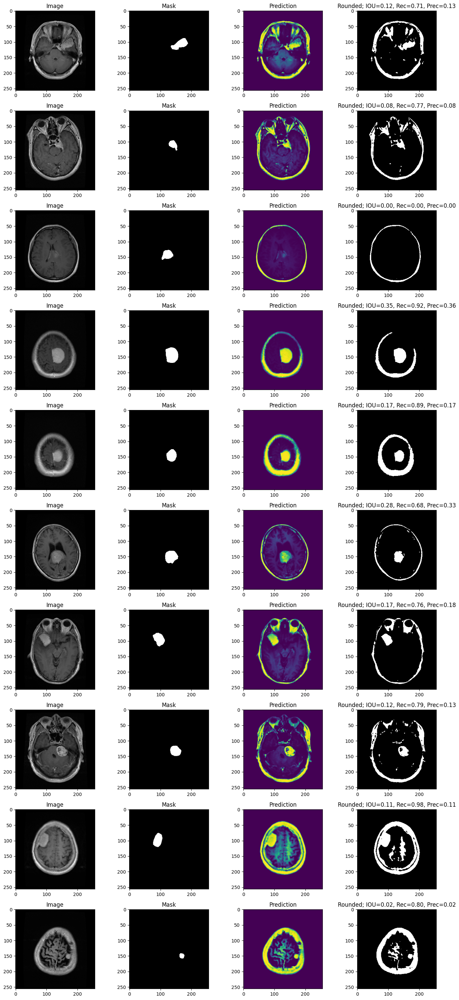

 Global Acc 	0.922
 AUC ROC 	0.937


************************************************************
Run # 5


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Training time: 0:00:24.527532


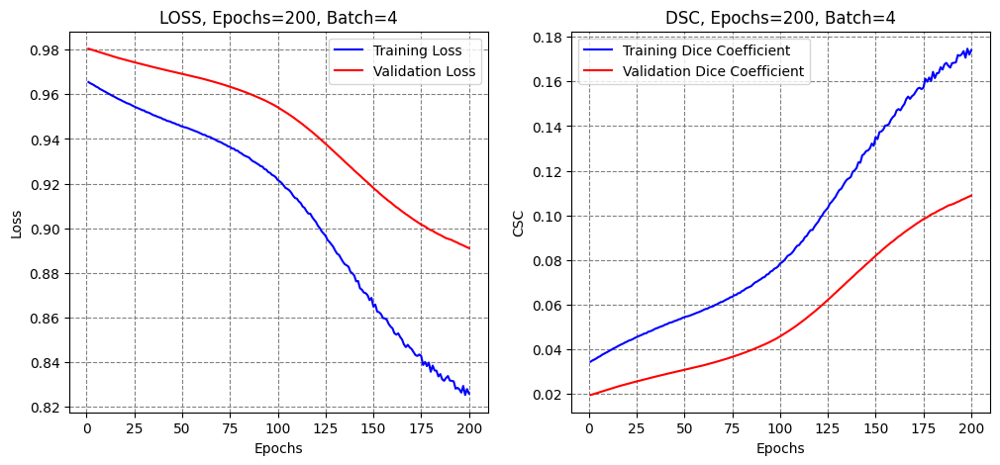

1/1 [==============================] - 0s 97ms/step
Testing time: 0:00:00.160746
------------------------------
USING THRESHOLD 0.5

 DSC 		0.260 
 IOU 		0.162 
 Recall 	0.585 
 Precision	0.186


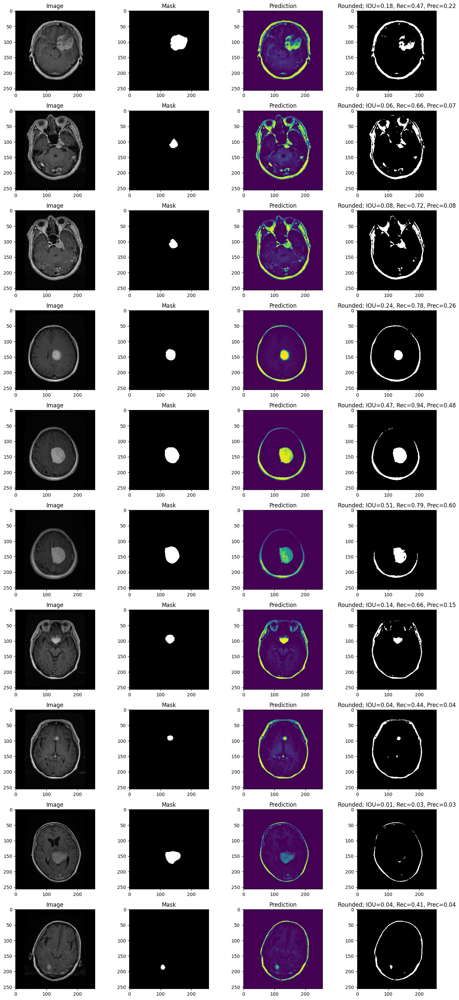

 Global Acc 	0.940
 AUC ROC 	0.934


************************************************************


In [ ]:
# Define the "R mask cnn" model
def RMaskCNN():
    input = Input(shape=input_size)

    # Define your architecture here
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(input)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    # Add more layers as needed

    # Define your architecture here
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(input)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    # Add more layers as needed

    # Define your architecture here
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(input)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    # Add more layers as needed

    # Define your architecture here
    conv4 = Conv2D(64, (3, 3), activation='relu', padding='same')(input)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)
    # Add more layers as needed

    # Define your architecture here
    conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(input)
    pool5 = MaxPooling2D(pool_size=(2, 2))(conv5)
    # Add more layers as needed

    # Define your architecture here
    conv6 = Conv2D(64, (3, 3), activation='relu', padding='same')(input)
    pool6 = MaxPooling2D(pool_size=(2, 2))(conv6)
    # Add more layers as needed

    # Define your architecture here
    conv7 = Conv2D(64, (3, 3), activation='relu', padding='same')(input)
    pool7 = MaxPooling2D(pool_size=(2, 2))(conv7)
    # Add more layers as needed

    # Define your architecture here
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(input)
    pool8 = MaxPooling2D(pool_size=(2, 2))(conv8)
    # Add more layers as needed

    # Define your architecture here
    conv9 = Conv2D(64, (3, 3), activation='relu', padding='same')(input)
    pool9 = MaxPooling2D(pool_size=(2, 2))(conv9)
    # Add more layers as needed

    # Define your architecture here
    conv10 = Conv2D(64, (3, 3), activation='relu', padding='same')(input)
    pool10 = MaxPooling2D(pool_size=(2, 2))(conv10)
    # Add more layers as needed


    output = Conv2D(1, (1, 1), activation='sigmoid')(conv10)  # Replace convX with the last convolution layer

    model = Model(inputs=input, outputs=output)
    return model

# Evaluate the models using k-fold cross-validation
n_folds = 5

numepochs = np.zeros(n_folds,)
dice_score = np.zeros(n_folds,)
iou_score = np.zeros_like(dice_score)
rec_score = np.zeros_like(dice_score)
prec_score = np.zeros_like(dice_score)
globacc_score = np.zeros_like(dice_score)
auc_roc_score = np.zeros_like(dice_score)

# Prepare cross-validation
kfold = KFold(n_folds, shuffle=True, random_state=1)

run = 0
# enumerate splits
for train_ix, test_ix in kfold.split(imgs):
    # Display the run number
    print('Run #', run+1)

    # Define the model
    model = RMaskCNN()  # Use the RMaskCNN model

    # Split into train and test sets
    imgs_train, masks_train, imgs_test, masks_test = imgs[train_ix], masks[train_ix], imgs[test_ix], masks[test_ix]

    # Compile and fit the model
    model.compile(optimizer=Adam(lr=0.0001), loss=dice_loss, metrics=[dsc])

    t = now()
    callbacks = [EarlyStopping(monitor='val_loss', patience=20)]
    history = model.fit(imgs_train, masks_train, validation_split=0.15, batch_size=batchnum,
                        epochs=epochnum, verbose=0, callbacks=callbacks)

    print('Training time: %s' % (now() - t))

    # Plot the loss and accuracy
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    acc = history.history['dsc']
    val_acc = history.history['val_dsc']

    epochsn = np.arange(1, len(train_loss)+1,1)
    plt.figure(figsize = (12,5))
    plt.subplot(121)
    plt.plot(epochsn,train_loss, 'b', label='Training Loss')
    plt.plot(epochsn,val_loss, 'r', label='Validation Loss')
    plt.grid(color='gray', linestyle='--')
    plt.legend()
    plt.title('LOSS, Epochs={}, Batch={}'.format(epochnum, batchnum))
    plt.xlabel('Epochs')
    plt.ylabel('Loss')

    plt.subplot(122)
    plt.plot(epochsn, acc, 'b', label='Training Dice Coefficient')
    plt.plot(epochsn, val_acc, 'r', label='Validation Dice Coefficient')
    plt.grid(color='gray', linestyle='--')
    plt.legend()
    plt.title('DSC, Epochs={}, Batch={}'.format(epochnum, batchnum))
    plt.xlabel('Epochs')
    plt.ylabel('CSC')
    plt.show()

    # Make predictions
    t = now()
    preds = model.predict(imgs_test)
    print('Testing time: %s' % (now() - t))

    # Evaluate model
    num_test = len(imgs_test)
    # Calculate performance metrics
    dsc_sc = np.zeros((num_test,1))
    iou_sc = np.zeros_like(dsc_sc)
    rec_sc = np.zeros_like(dsc_sc)
    tn_sc = np.zeros_like(dsc_sc)
    prec_sc = np.zeros_like(dsc_sc)
    thresh = 0.5
    for i in range(num_test):
        dsc_sc[i], iou_sc[i], rec_sc[i], prec_sc[i] = auc(masks_test[i], preds[i] >thresh)
    print('-'*30)
    print('USING THRESHOLD', thresh)
    print('\n DSC \t\t{0:^.3f} \n IOU \t\t{1:^.3f} \n Recall \t{2:^.3f} \n Precision\t{3:^.3f}'.format(
            np.sum(dsc_sc)/num_test,
            np.sum(iou_sc)/num_test,
            np.sum(rec_sc)/num_test,
            np.sum(prec_sc)/num_test ))


    # To plot a set of images with predicted masks uncomment these lines
    num_disp = 10
    j=1
    plt.figure(figsize = (14,num_disp*3))
    for i in range(num_disp):
        plt.subplot(num_disp,4,j)
        plt.imshow(np.squeeze(imgs_test[i]), cmap='gray')
        plt.title('Image')
        j +=1
        plt.subplot(num_disp,4,j)
        plt.imshow(np.squeeze(masks_test[i]),cmap='gray')
        plt.title('Mask')
        j +=1
        plt.subplot(num_disp,4,j)
        plt.imshow(np.squeeze(preds[i]))
        plt.title('Prediction')
        j +=1
        plt.subplot(num_disp,4,j)
        plt.imshow(np.squeeze(np.round(preds[i])), cmap='gray')
        plt.title('Rounded; IOU=%0.2f, Rec=%0.2f, Prec=%0.2f' %(iou_sc[i], rec_sc[i], prec_sc[i]))
        j +=1
    plt.tight_layout()
    plt.show()


    # Confusion matrix
    confusion = confusion_matrix( masks_test.ravel(),preds.ravel()>thresh)
    accuracy = 0
    if float(np.sum(confusion))!=0:
        accuracy = float(confusion[0,0]+confusion[1,1])/float(np.sum(confusion))
    print(' Global Acc \t{0:^.3f}'.format(accuracy))

    # Area under the ROC curve
    AUC_ROC = roc_auc_score(masks_test.ravel(), preds.ravel())
    print(' AUC ROC \t{0:^.3f}'.format(AUC_ROC))
    print('\n')
    print('*'*60)

    # Save outputs
    numepochs[run] = epochsn[-1]
    dice_score[run] = np.sum(dsc_sc) / num_test
    iou_score[run] = np.sum(iou_sc) / num_test
    rec_score[run] = np.sum(rec_sc) / num_test
    prec_score[run] = np.sum(prec_sc) / num_test
    globacc_score[run] = accuracy
    auc_roc_score[run] = AUC_ROC
    run += 1


In [ ]:
# Display the scores in a table
import pandas
from pandas import DataFrame
df = DataFrame({'Epochs Number': numepochs, 'Dice Score': dice_score, 'IOU Score': iou_score, 'Recall (Sensitivity)': rec_score, 'Precision': prec_score, 'Global Accuracy': globacc_score, 'AUC-ROC': auc_roc_score})
df

,Epochs Number,Dice Score,IOU Score,Recall (Sensitivity),Precision,Global Accuracy,AUC-ROC
0,200.0,0.231631,0.138456,0.684452,0.157132,0.924708,0.921476
1,200.0,0.202598,0.116065,0.713039,0.130445,0.924963,0.929601
2,200.0,0.207108,0.120568,0.677845,0.141754,0.916746,0.904126
3,200.0,0.208919,0.123158,0.717920,0.129863,0.922086,0.936832
4,200.0,0.259892,0.161605,0.585191,0.186016,0.939996,0.934082


In [ ]:
# Calculate mean values of the scores
numepochs_mean = np.mean(numepochs)
dice_mean = np.mean(dice_score)
iou_mean = np.mean(iou_score)
rec_mean = np.mean(rec_score)
prec_mean = np.mean(prec_score)
globacc_mean = np.mean(globacc_score)
auc_roc_mean = np.mean(auc_roc_score)

# Mean values of the scores
df2 = DataFrame({'Epochs Number Mean': numepochs_mean, 'Dice Score Mean': dice_mean, 'IOU Score Mean': iou_mean, 'Recall (Sensitivity) Mean': rec_mean, 'Precision Mean': prec_mean, 'Global Accuracy Mean': globacc_mean, 'AUC-ROC Mean': auc_roc_mean},index=[5])
df2

,Epochs Number Mean,Dice Score Mean,IOU Score Mean,Recall (Sensitivity) Mean,Precision Mean,Global Accuracy Mean,AUC-ROC Mean
5,200.0,0.22203,0.13197,0.675689,0.149042,0.9257,0.925224


In [ ]:
# Calculate standard deviations of the scores
dice_std = np.std(dice_score)
iou_std = np.std(iou_score)
rec_std = np.std(rec_score)
prec_std = np.std(prec_score)
globacc_std = np.std(globacc_score)
auc_roc_std = np.std(auc_roc_score)


# Standard deviations of the scores
df3 = DataFrame({'Dice Score STD': dice_std, 'IOU Score STD': iou_std, 'Recall (Sensitivity) STD': rec_std, 'Precision STD': prec_std, 'Global Accuracy STD': globacc_std, 'AUC-ROC STD': auc_roc_std}, index=[5])
df3

,Dice Score STD,IOU Score STD,Recall (Sensitivity) STD,Precision STD,Global Accuracy STD,AUC-ROC STD
5,0.021438,0.016619,0.047854,0.020973,0.007735,0.01176
